# **Data exploration**


## Loading data & General information

I' will start with loading data, variables, description and all modules essential for the task. Initial file with the data is a file in a CSV format with semicolon as a separator.

In [2]:
# Load all necessary modules
# For data manipulation and visualization
import pandas as pd

pd.set_option("display.max_columns", None)
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sb
import plotly.express as px
import missingno as msno

# Custom functions
from datavis_fun import *

# For code style accuracy
import jupyter_black

jupyter_black.load()

In [3]:
descr = pd.read_csv("data_desc.csv", sep=",", encoding="cp1251")
descr

,Атрибуты,Описание,Description,Unnamed: 3,Unnamed: 4
0,Номер варианта,Номер варианта,Variant number,NaN,NaN
1,ID,Идентификатор клиента,Client ID,NaN,NaN
2,INCOME_BASE_TYPE,Подтверждение дохода,Income verification,NaN,NaN
3,CREDIT_PURPOSE,Цель получения кредита,Purpose of the loan,NaN,NaN
4,INSURANCE_FLAG,Страхование заемщика при получении кредита,Borrower's insurance when receiving a loan,NaN,NaN
5,DTI,debt-to-income ratio — отношение долга к доходам,debt-to-income ratio - the ratio of debt to in...,NaN,NaN
6,SEX,Пол,Floor,NaN,NaN
7,FULL_AGE_CHILD_NUMBER,Кол-во лет ребенку,Number of years of the child,NaN,NaN
8,DEPENDANT_NUMBER,Кол-во иждивенцев,Number of dependents,NaN,NaN
9,EDUCATION,Образование,Education,NaN,NaN


In [4]:
# Load data
orig = pd.read_csv("bank_customers_data.csv")
orig.head(10)

,ID,INCOME_BASE_TYPE,CREDIT_PURPOSE,INSURANCE_FLAG,DTI,SEX,FULL_AGE_CHILD_NUMBER,DEPENDANT_NUMBER,EDUCATION,EMPL_TYPE,EMPL_SIZE,BANKACCOUNT_FLAG,Period_at_work,age,EMPL_PROPERTY,EMPL_FORM,FAMILY_STATUS,max90days,max60days,max30days,max21days,max14days,avg_num_delay,if_zalog,num_AccountActive180,num_AccountActive90,num_AccountActive60,Active_to_All_prc,numAccountActiveAll,numAccountClosed,sum_of_paym_months,all_credits,Active_not_cc,own_closed,min_MnthAfterLoan,max_MnthAfterLoan,dlq_exist,thirty_in_a_year,sixty_in_a_year,ninety_in_a_year,thirty_vintage,sixty_vintage,ninety_vintage
0,1000015,Bank form (without employer stamp),Vacation,0.0,0.34,female,0,0,higher,specialist,>250,0.0,17.0,25.0,Finance,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1000035,Free form with employer stamp,Education,1.0,0.32,female,2,0,higher,senior manager,< 50,3.0,25.0,37.0,Other,LLC,married,2.0,2.0,1.0,1.0,0.0,0.000000,0.0,1.0,0.0,0.0,1.000000,2.0,0.0,5.0,2.0,0.0,0.0,3.0,31.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1000055,Bank form (without employer stamp),Repair,0.0,0.39,male,1,0,*n.a.*,Sales Manager,>250,0.0,51.0,31.0,Trade,LLC,divorced / divorced,2.0,1.0,1.0,0.0,0.0,0.063063,0.0,0.0,0.0,0.0,0.200000,2.0,8.0,104.0,10.0,1.0,1.0,4.0,81.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1000075,Receipt of salary into account,Buying a car,0.0,0.28,male,1,0,higher,specialist,>250,0.0,85.0,29.0,Other,LLC,married,0.0,0.0,0.0,0.0,0.0,0.051282,1.0,0.0,0.0,0.0,0.500000,2.0,2.0,74.0,4.0,1.0,0.0,17.0,80.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1000095,2NDFL,Buying a car,1.0,0.55,male,1,0,higher,specialist,>250,3.0,52.0,25.0,Civil service,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,1000115,2NDFL,Real estate purchase/construction,1.0,0.59,female,0,0,incomplete higher education,support staff,>250,3.0,65.0,26.0,The science,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,1000135,Receipt of salary into account,Buying a car,1.0,0.18,male,0,0,second higher education,specialist,>250,1.0,10.0,25.0,Other,CJSC,"single, not married",2.0,2.0,1.0,1.0,0.0,0.000000,1.0,0.0,0.0,0.0,0.000000,0.0,2.0,12.0,2.0,0.0,0.0,12.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,1000155,Receipt of salary into account,Repair,1.0,0.44,female,0,0,higher,specialist,>100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,1000175,2NDFL,Real estate purchase/construction,1.0,0.49,male,0,0,specialized secondary,support staff,>250,3.0,31.0,45.0,Production,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,1000195,Receipt of salary into account,Vacation,1.0,0.17,male,0,0,higher,specialist,>250,0.0,55.0,28.0,Other,LLC,married,1.0,1.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.166667,1.0,5.0,56.0,6.0,1.0,1.0,12.0,45.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


The first thing I would like to do is to rename columns in a such way that it would be easier to refer to them later.

In [5]:
orig = standardize_colnames(orig)
orig.columns

Index(['id', 'income_base_type', 'credit_purpose', 'insurance_flag', 'dti',
       'sex', 'full_age_child_number', 'dependant_number', 'education',
       'empl_type', 'empl_size', 'bankaccount_flag', 'period_at_work', 'age',
       'empl_property', 'empl_form', 'family_status', 'max90days', 'max60days',
       'max30days', 'max21days', 'max14days', 'avg_num_delay', 'if_zalog',
       'num_accountactive180', 'num_accountactive90', 'num_accountactive60',
       'active_to_all_prc', 'numaccountactiveall', 'numaccountclosed',
       'sum_of_paym_months', 'all_credits', 'active_not_cc', 'own_closed',
       'min_mnthafterloan', 'max_mnthafterloan', 'dlq_exist',
       'thirty_in_a_year', 'sixty_in_a_year', 'ninety_in_a_year',
       'thirty_vintage', 'sixty_vintage', 'ninety_vintage'],
      dtype='object')

In [6]:
orig.shape

(10242, 43)

In [7]:
orig.id.nunique()

10242

The dataset in it's original state has 10242 rows and 43 columns which can be demonstrated with the code above. However, the first column is a client ID , so it can be dropped as such column will not give us any insights on the data. Without this column we will be left with 42 columns in total.

In [8]:
orig = orig.drop(columns="id")

We can see that there're are 3 types of data presented in a dataset: float64, int64 and object:

In [9]:
orig.dtypes.unique()

array([dtype('O'), dtype('float64'), dtype('int64')], dtype=object)

In [10]:
orig.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10242 entries, 0 to 10241
Data columns (total 42 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   income_base_type       10188 non-null  object 
 1   credit_purpose         10242 non-null  object 
 2   insurance_flag         10241 non-null  float64
 3   dti                    10127 non-null  float64
 4   sex                    10242 non-null  object 
 5   full_age_child_number  10242 non-null  int64  
 6   dependant_number       10242 non-null  int64  
 7   education              10242 non-null  object 
 8   empl_type              10234 non-null  object 
 9   empl_size              10131 non-null  object 
 10  bankaccount_flag       7922 non-null   float64
 11  period_at_work         7921 non-null   float64
 12  age                    7922 non-null   float64
 13  empl_property          7922 non-null   object 
 14  empl_form              3932 non-null   object 
 15  fa

Unfortunately, some columns might have the wrong type of data assigned to them. This is especially true for dummy variables as Python may consider them as numeric values. This is exactly what happens here. It can be seen with a column sixty_vintage, for example. After assigning the correct type of data to columns, I would optimize data based on their values to save memory.

In [11]:
opt = orig.copy()
cat_cols = [
    "income_base_type",
    "credit_purpose",
    "insurance_flag",
    "sex",
    "education",
    "empl_type",
    "empl_size",
    "bankaccount_flag",
    "empl_property",
    "empl_form",
    "family_status",
    "if_zalog",
    "dlq_exist",
    "thirty_in_a_year",
    "sixty_in_a_year",
    "ninety_in_a_year",
    "thirty_vintage",
    "sixty_vintage",
    "ninety_vintage",
]

for i in opt[cat_cols]:
    opt[i] = opt[i].astype("object")


opt = optimize_memory(opt)

In [12]:
print("Number of Categorical Features is {}".format(opt[cat_cols].shape[1]))

Number of Categorical Features is 19


In [13]:
print(
    "Number of Numeric Features is {}".format(
        opt[opt.columns.difference(cat_cols)].shape[1]
    )
)

Number of Numeric Features is 23


Let me demonstrate dataframe with correct data types and optimized memory consumption:

In [14]:
opt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10242 entries, 0 to 10241
Data columns (total 42 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   income_base_type       10188 non-null  category
 1   credit_purpose         10242 non-null  category
 2   insurance_flag         10241 non-null  category
 3   dti                    10127 non-null  float16 
 4   sex                    10242 non-null  category
 5   full_age_child_number  10242 non-null  int16   
 6   dependant_number       10242 non-null  int16   
 7   education              10242 non-null  category
 8   empl_type              10234 non-null  category
 9   empl_size              10131 non-null  category
 10  bankaccount_flag       7922 non-null   category
 11  period_at_work         7921 non-null   float16 
 12  age                    7922 non-null   float16 
 13  empl_property          7922 non-null   category
 14  empl_form              3932 non-null  

## Categorical & Numeric data

### Missing values exploration

In [15]:
import os


def save_fig_custom(pic_name: str, foldertosave: str = None, fmt: str = "png"):
    if foldertosave != None:
        folder_path = f"{os.getcwd()}\\{foldertosave}"
        if os.path.exists(folder_path):
            pass

        else:
            os.mkdir(folder_path)

        fig.savefig(fname=f"{folder_path}\\{pic_name}.{fmt}")
        print(f"The graph was saved into {folder_path}")
    else:
        fig.savefig(fname=f"{pic_name}")

In [16]:
na_df = missing_tab(opt)
na_df

,column_name,no_missing,percent_missing
0,avg_num_delay,6627,64.70
1,if_zalog,6613,64.57
2,num_accountactive90,6613,64.57
3,num_accountactive60,6613,64.57
4,active_to_all_prc,6613,64.57
5,numaccountactiveall,6613,64.57
6,numaccountclosed,6613,64.57
7,sum_of_paym_months,6613,64.57
8,all_credits,6613,64.57
9,active_not_cc,6613,64.57


### Visualizing missing data

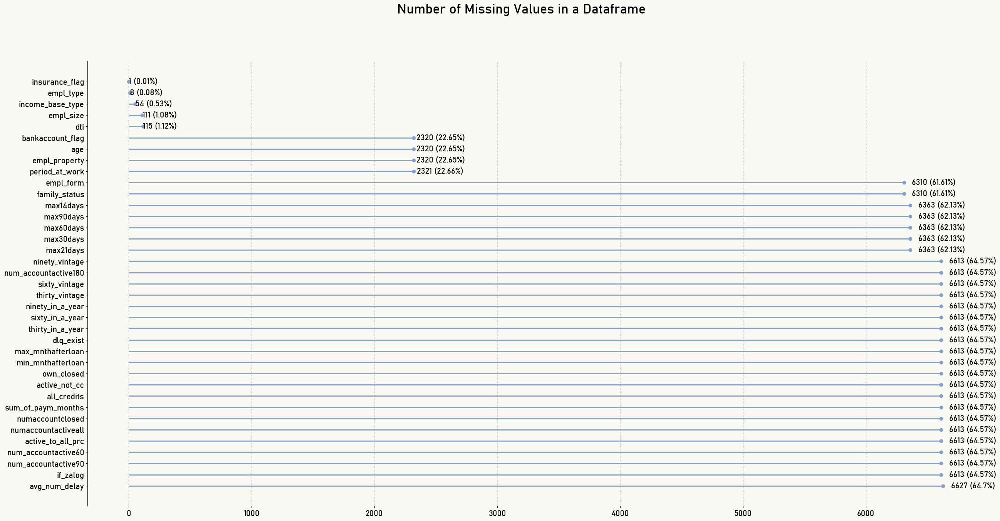

In [17]:
fig, ax = plot_na(opt)
save_fig_custom(pic_name="missing_values")

<AxesSubplot: >

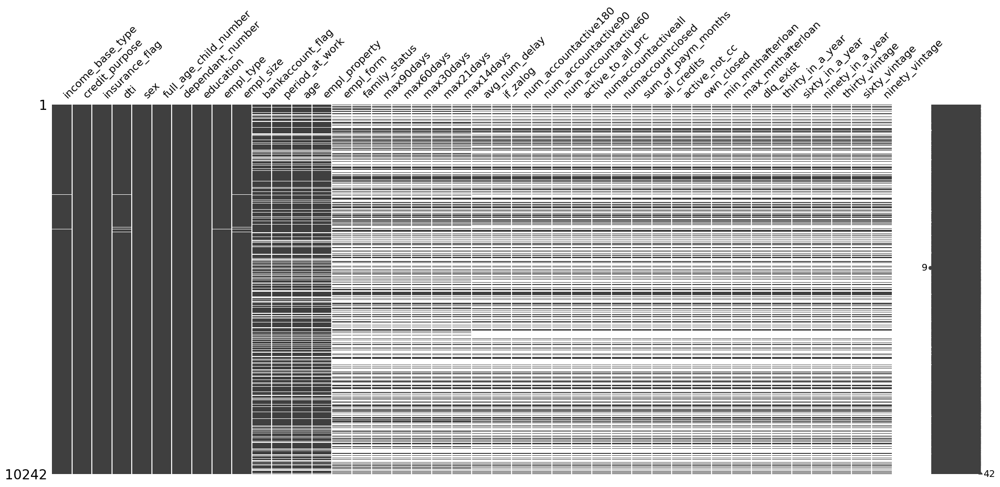

In [18]:
msno.matrix(opt)

<AxesSubplot: >

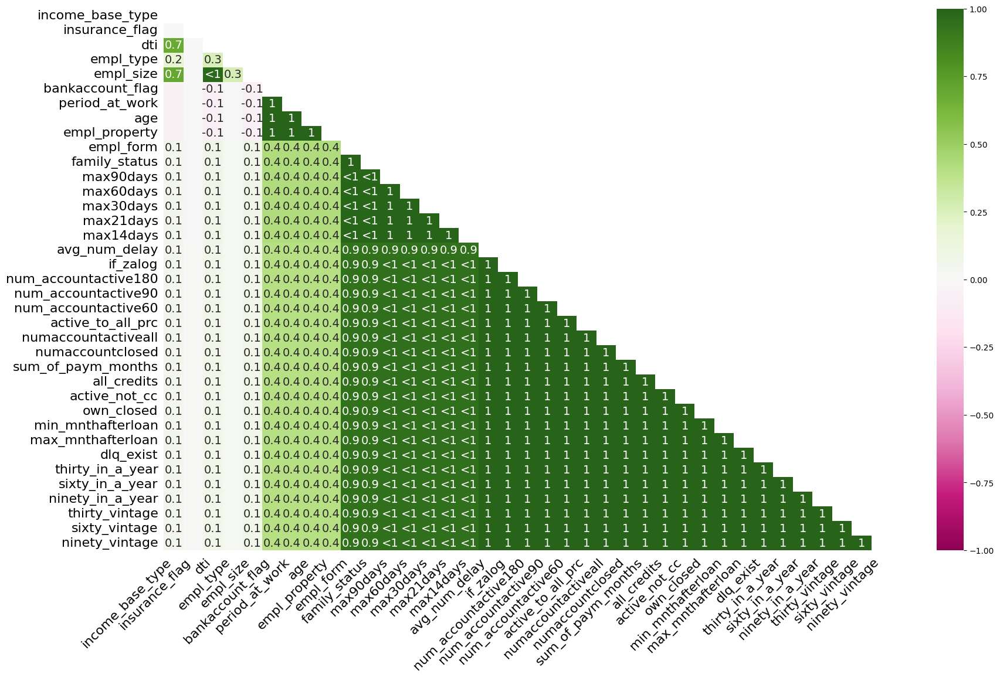

In [19]:
msno.heatmap(opt, cmap="PiYG")

Variables with values close or equal to 1 are usually absent 'together' within a row.

### Categorical data overview

In this section I want to examine unique values for categorical columns and provide a reader with some general information about the dataset related to categories presented there. I would like to start with showing unique values for each category.

In [20]:
unq_cat_df(df=opt, ctg_cols=cat_cols)

,income_base_type,credit_purpose,insurance_flag,sex,education,empl_type,empl_size,bankaccount_flag,empl_property,empl_form,family_status,if_zalog,dlq_exist,thirty_in_a_year,sixty_in_a_year,ninety_in_a_year,thirty_vintage,sixty_vintage,ninety_vintage
0,Bank form (without employer stamp),Vacation,0.0,female,higher,specialist,>250,0.0,Finance,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Free form with employer stamp,Education,1.0,male,*n.a.*,senior manager,< 50,3.0,Other,LLC,married,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Receipt of salary into account,Repair,NaN,,incomplete higher education,Sales Manager,>100,1.0,Trade,CJSC,divorced / divorced,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,2NDFL,Buying a car,,,second higher education,support staff,>=200,NaN,Civil service,OJSC,"single, not married",,,,,,,,
4,NaN,Real estate purchase/construction,,,specialized secondary,middle manager,>=50,4.0,The science,Individual entrepreneur,remarriage,,,,,,,,
5,,Other,,,Higher/Second Higher/Academic Degree,worker,NaN,,NaN,Another form,civil marriage,,,,,,,,
6,,Purchasing household appliances,,,average,Sales Representative,>=100,,Production,State enterprise,widower/widow,,,,,,,,
7,,Treatment,,,academic degree,other,>=150,,Information Technology,,,,,,,,,,
8,,Buying furniture,,,Lower secondary,NaN,*n.a.*,,Transport,,,,,,,,,,
9,,Buying land,,,,insurance agent,,,Construction,,,,,,,,,,



If we will look at the table above we can clearly see some mistakes in categorical data. 
- In education column we can see a possible entry which includes bachelors degree (higher), masters degree (second higher) and PhD (academic degree). At the same time we have individuals whose education level is stated explicitly as bachelors or masters degree.
   
- Salary column has entry '>100' and '>=100'.
  
- There are * n.a. * entries in some columns

- I also want to uppercase all categorical variables for consistency 
- After looking at categorical data, we could notice a few mistakes there:

- There is also a problem with 'BANKACCOUNT_FLAG' as values above 2 actually represent the same state so we do not really need 3, 4 and so on.

### Fixing Errors in categorical data

I'm not going to approximate missing categorical data entries, such rows will be deleted in my solution.

In [21]:
opt = opt.replace({"Nan": np.nan})
opt = opt.dropna(subset=cat_cols)


# WORKS
opt.empl_size = opt.empl_size.replace({">100": ">=100", "*n.a.*": np.nan})

# WORKS
opt.education = opt.education.replace(
    {
        "higher": "Higher/Second Higher/Academic Degree",
        "second higher education": "Higher/Second Higher/Academic Degree",
        "academic degree": "Higher/Second Higher/Academic Degree",
        "average": "high school",
        "specialized secondary": "secondary professional education",
        "*n.a.*": np.nan,
    }
)

opt = opt.dropna(subset=cat_cols)
opt.bankaccount_flag = opt["bankaccount_flag"].replace([3.0, 4.0], 2.0)


for i in cat_cols:
    if i != "empl_form":
        opt[i] = opt[i].astype(str).apply(lambda x: x.capitalize())
    else:
        pass

In [22]:
unq_cat_df(df=opt, ctg_cols=cat_cols)

,income_base_type,credit_purpose,insurance_flag,sex,education,empl_type,empl_size,bankaccount_flag,empl_property,empl_form,family_status,if_zalog,dlq_exist,thirty_in_a_year,sixty_in_a_year,ninety_in_a_year,thirty_vintage,sixty_vintage,ninety_vintage
0,Free form with employer stamp,Education,1.0,Female,Higher/second higher/academic degree,Senior manager,< 50,2.0,Other,LLC,Married,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Receipt of salary into account,Buying a car,0.0,Male,Secondary professional education,Specialist,>250,0.0,Trade,CJSC,"Single, not married",1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,Bank form (without employer stamp),Vacation,,,High school,Support staff,,1.0,Information technology,OJSC,Remarriage,,,,,,,,
3,2ndfl,Repair,,,Incomplete higher education,Middle manager,,,Agriculture and forestry,Individual entrepreneur,Civil marriage,,,,,,,,
4,,Real estate purchase/construction,,,Lower secondary,Sales representative,,,Legal services,Another form,Divorced / divorced,,,,,,,,
5,,Purchasing household appliances,,,,Worker,,,,State enterprise,Widower/widow,,,,,,,,
6,,Other,,,,Other,,,,,,,,,,,,,
7,,Buying land,,,,Sales manager,,,,,,,,,,,,,
8,,Treatment,,,,,,,,,,,,,,,,,
9,,Buying furniture,,,,,,,,,,,,,,,,,


### Categorical Data Visualization  

In [23]:
cat_f = opt[cat_cols].columns

In [24]:
fig, ax = plot_count_perc(
    df=opt, cols=cat_f[0:6], gentitle="Categorical Features I", nrows=2, ncols=3
)
save_fig_custom(pic_name="cat_f_I", foldertosave="categorical_vis")

The graph was saved into d:\python\bank-segmentation\categorical_vis


In [25]:
fig, ax = plot_count_perc(
    df=opt, cols=cat_f[6:12], gentitle="Categorical Features II", nrows=2, ncols=3
)
save_fig_custom(pic_name="cat_f_II", foldertosave="categorical_vis")

The graph was saved into d:\python\bank-segmentation\categorical_vis


In [26]:
fig, ax = plot_count_perc(
    df=opt, cols=cat_f[12:], gentitle="Categorical Features III", nrows=2, ncols=4
)
save_fig_custom(pic_name="cat_f_III", foldertosave="categorical_vis")

The graph was saved into d:\python\bank-segmentation\categorical_vis


### Numeric Data Overview

In [27]:
df_num = opt[opt.columns.difference(cat_cols)]

In [28]:
num_info = df_num.describe()
num_info = num_info.iloc[1:, :]
num_info

,active_not_cc,active_to_all_prc,age,all_credits,avg_num_delay,dependant_number,dti,full_age_child_number,max14days,max21days,max30days,max60days,max90days,max_mnthafterloan,min_mnthafterloan,num_accountactive180,num_accountactive60,num_accountactive90,numaccountactiveall,numaccountclosed,own_closed,period_at_work,sum_of_paym_months
mean,1.092773,0.424316,inf,5.753906,0.062164,0.004426,0.389893,0.553250,0.481934,0.593750,0.825684,1.123047,1.596680,inf,14.34375,0.390869,0.103699,0.164795,2.195312,3.556641,0.720215,inf,inf
std,1.088867,0.292236,8.421875,4.136719,0.115967,0.070435,0.136475,0.774078,1.005859,1.137695,1.372070,1.599609,1.927734,30.9375,15.68750,0.697754,0.356934,0.453613,1.684570,3.255859,1.058594,inf,inf
min,0.000000,0.000000,23.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,-1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.0,0.0
25%,0.000000,0.222168,29.000000,3.000000,0.000000,0.000000,0.280029,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,34.0000,4.00000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,19.0,29.0
50%,1.000000,0.399902,34.000000,5.000000,0.014282,0.000000,0.409912,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,67.0000,10.00000,0.000000,0.000000,0.000000,2.000000,3.000000,0.000000,40.0,63.0
75%,2.000000,0.583496,42.000000,8.000000,0.069946,0.000000,0.489990,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,88.0000,19.00000,1.000000,0.000000,0.000000,3.000000,5.000000,1.000000,77.0,114.0
max,8.000000,1.000000,62.000000,33.000000,1.000000,2.000000,0.589844,7.000000,12.000000,12.000000,15.000000,22.000000,22.000000,178.0000,107.00000,6.000000,3.000000,4.000000,11.000000,27.000000,7.000000,478.0,505.0


In [29]:
num_cols = opt[opt.columns.difference(cat_cols)].columns
num_cols

Index(['active_not_cc', 'active_to_all_prc', 'age', 'all_credits',
       'avg_num_delay', 'dependant_number', 'dti', 'full_age_child_number',
       'max14days', 'max21days', 'max30days', 'max60days', 'max90days',
       'max_mnthafterloan', 'min_mnthafterloan', 'num_accountactive180',
       'num_accountactive60', 'num_accountactive90', 'numaccountactiveall',
       'numaccountclosed', 'own_closed', 'period_at_work',
       'sum_of_paym_months'],
      dtype='object')

### Numeric Data Visualization

The graph was saved into d:\python\bank-segmentation\num_vis


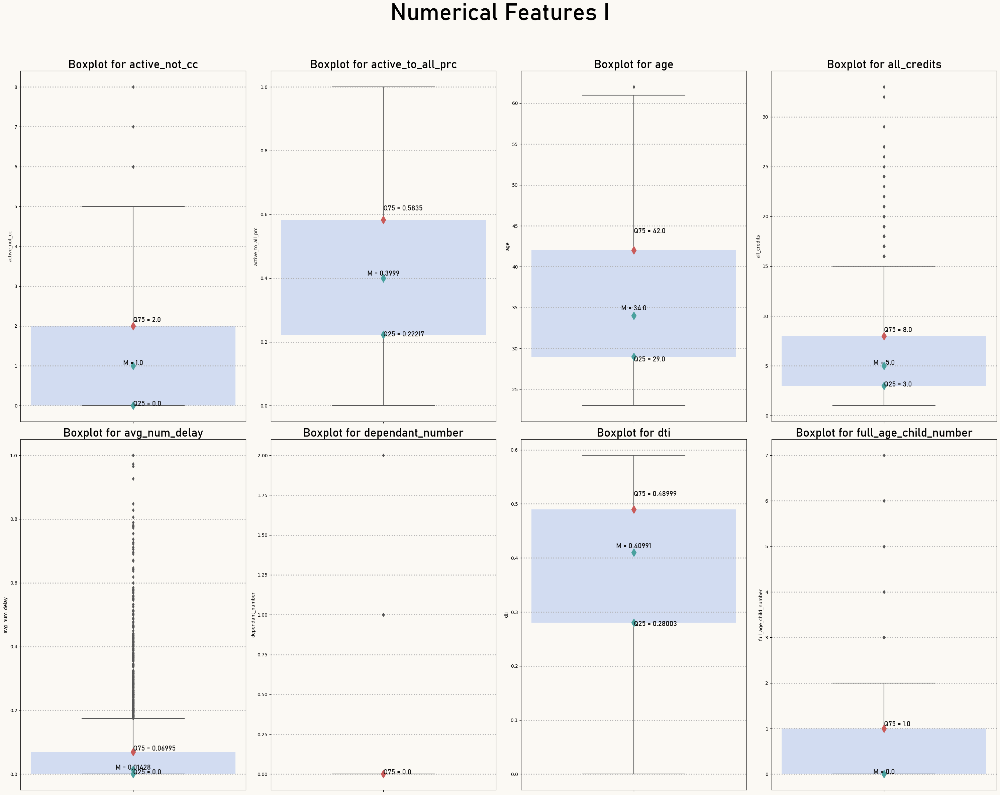

In [30]:
fig, ax = bplots_custom(
    df=opt,
    cols=num_cols[0:8],
    nrows=2,
    ncols=4,
    gentitle="Numerical Features I",
    gentitlesize=50,
)
save_fig_custom(pic_name="num_f_I", foldertosave="num_vis")

The graph was saved into d:\python\bank-segmentation\num_vis


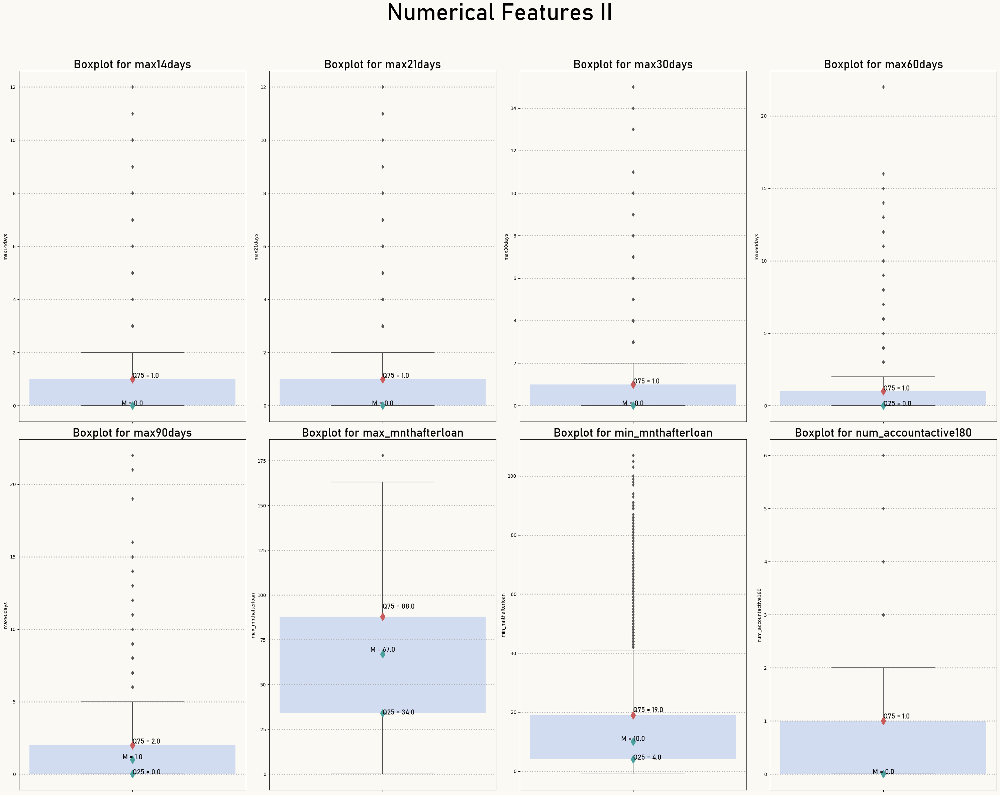

In [31]:
fig, ax = bplots_custom(
    df=opt,
    cols=num_cols[8:16],
    nrows=2,
    ncols=4,
    gentitle="Numerical Features II",
    gentitlesize=50,
)
save_fig_custom(pic_name="num_f_II", foldertosave="num_vis")

The graph was saved into d:\python\bank-segmentation\num_vis


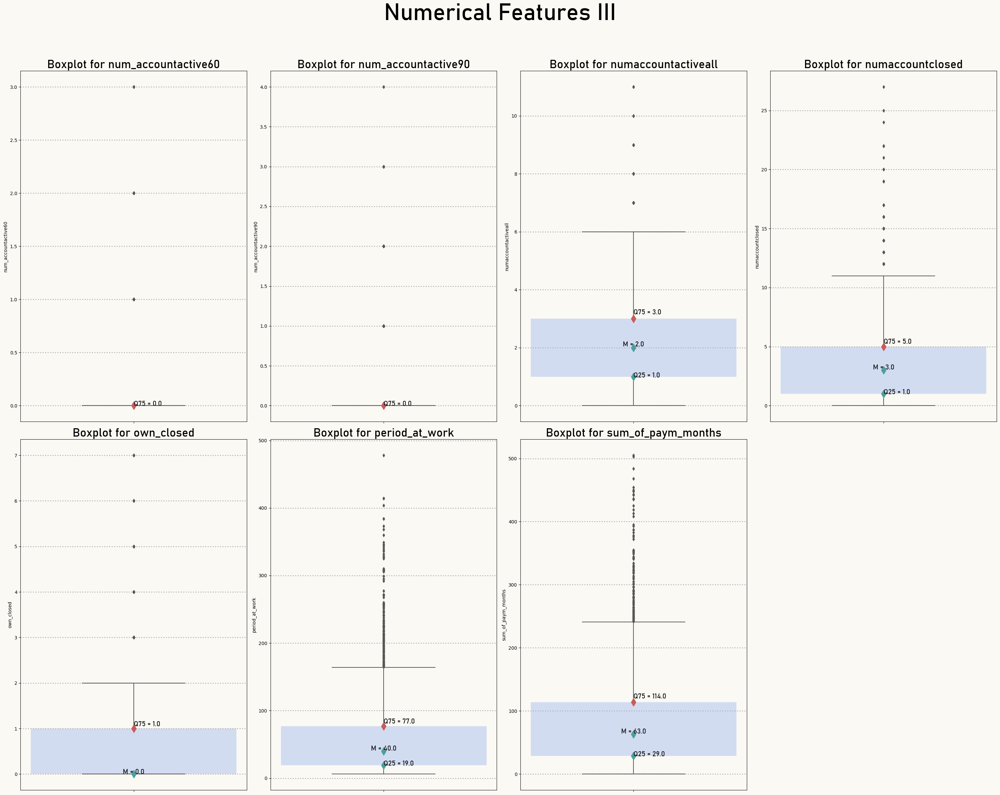

In [32]:
fig, ax = bplots_custom(
    df=opt,
    cols=num_cols[16:],
    nrows=2,
    ncols=4,
    gentitle="Numerical Features III",
    gentitlesize=50,
)
save_fig_custom(pic_name="num_f_III", foldertosave="num_vis")

### Numerical values exploration

In [33]:
df_num.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3615 entries, 1 to 10239
Data columns (total 23 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   active_not_cc          3615 non-null   float16
 1   active_to_all_prc      3615 non-null   float16
 2   age                    3615 non-null   float16
 3   all_credits            3615 non-null   float16
 4   avg_num_delay          3601 non-null   float16
 5   dependant_number       3615 non-null   int16  
 6   dti                    3614 non-null   float16
 7   full_age_child_number  3615 non-null   int16  
 8   max14days              3611 non-null   float16
 9   max21days              3611 non-null   float16
 10  max30days              3611 non-null   float16
 11  max60days              3611 non-null   float16
 12  max90days              3611 non-null   float16
 13  max_mnthafterloan      3615 non-null   float16
 14  min_mnthafterloan      3615 non-null   float16
 15  num

In [34]:
na_tab = missing_tab(df_num)
na_tab

,column_name,no_missing,percent_missing
0,avg_num_delay,14,0.39
1,max60days,4,0.11
2,max14days,4,0.11
3,max21days,4,0.11
4,max30days,4,0.11
5,max90days,4,0.11
6,period_at_work,1,0.03
7,dti,1,0.03


I will replace missing values for numerical data with column averages.

In [35]:
col_w_na = na_tab.column_name.values
# col_w_na

for i in col_w_na:
    # Calculate average for a column
    avg_val = opt[i].mean()
    opt[i] = opt[i].fillna(avg_val)

In [36]:
# No missing values in a dataframe
missing_tab(opt)

,column_name,no_missing,percent_missing


In [37]:
nrows_after = (opt.shape[0] / orig.shape[0]) * 100

print(
    f"Cleaned dataframe contains {round(nrows_after, 2)}% of entries from the original dataframe"
)

Cleaned dataframe contains 35.3% of entries from the original dataframe


- My aim is to make segments of clients and so I assume that with respect to this goal, the bank is not interested in clients which aren't active ones, as these people are not the main target of such kind of analysis.       

### Final dataset 

In [38]:
sorted_df = opt[opt["num_accountactive180"] > 0]

In [39]:
nrows_after = (sorted_df.shape[0] / orig.shape[0]) * 100

print(
    f"Sorted dataframe contains {round(nrows_after, 2)}% of entries from the original dataframe"
)

Sorted dataframe contains 10.3% of entries from the original dataframe


Check data types of columns again:

In [40]:
sorted_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1055 entries, 1 to 10235
Data columns (total 42 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   income_base_type       1055 non-null   object  
 1   credit_purpose         1055 non-null   object  
 2   insurance_flag         1055 non-null   object  
 3   dti                    1055 non-null   float16 
 4   sex                    1055 non-null   object  
 5   full_age_child_number  1055 non-null   int16   
 6   dependant_number       1055 non-null   int16   
 7   education              1055 non-null   object  
 8   empl_type              1055 non-null   object  
 9   empl_size              1055 non-null   object  
 10  bankaccount_flag       1055 non-null   object  
 11  period_at_work         1055 non-null   float16 
 12  age                    1055 non-null   float16 
 13  empl_property          1055 non-null   object  
 14  empl_form              1055 non-null   

In [41]:
sorted_df.to_csv("bank_customers_cleaned.csv", index=False)